In [1]:
import warnings
warnings.filterwarnings('ignore')

from honest_ml.trainer import (
    RegressionTrainer, ClassificationTrainer, 
    EvaluateModel, EvaluateModelAndHyperParameters
)
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
import pandas as pd
import numpy as np

clf = LogisticRegression()
X, y = make_classification(
    n_samples=1000,  n_features=100,
    n_informative=90, n_redundant=2,
    random_state=0
)
X = pd.DataFrame(X)
y = pd.Series(y)
num_trials = 100
hyperparameters = ["C", "tol", "max_iter"]
clf_eval = EvaluateModelAndHyperParameters(
    "classification", 
    clf, X, y, num_trials,
    hyperparameters,
    sufficient_compute=True
)
model_instances = clf_eval.fit_random("random")


                You are trying to make 12000 calculations.
                Are you sure you have enough compute?
                


In [13]:
clf.get_params()

{'C': 3.2361316657481457e-278,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': -3.649748548626145e-279,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 1.2080475275651486e-284,
 'verbose': 0,
 'warm_start': False}

In [2]:
model_instances[0]

{'0': {'precision': 0.58,
  'recall': 1.0,
  'f1-score': 0.7341772151898733,
  'support': 58},
 '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42},
 'accuracy': 0.58,
 'macro avg': {'precision': 0.29,
  'recall': 0.5,
  'f1-score': 0.36708860759493667,
  'support': 100},
 'weighted avg': {'precision': 0.33640000000000003,
  'recall': 0.58,
  'f1-score': 0.42582278481012653,
  'support': 100},
 'hyperparameter_set': 0,
 'mask': array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True, False,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True, False,  True,  True,  True, False,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  Tr

In [2]:
from scipy import stats

# for classification

def group_model_instances(model_instances):
    hp_group = {}
    for model_instance in model_instances:
        hp_set = model_instance["hyperparameter_set"]
        if hp_set not in hp_group:
            hp_group[hp_set] = [model_instance]
        else:
            hp_group[hp_set].append(model_instance)
    return hp_group

def describe_scores(measure, hp_groups, classes):
    hp_score = {}
    for group in hp_groups:
        hp_score[group] = {
                "f1-score, macro-avg": measure([
                model_instance["macro avg"]["f1-score"]
                for model_instance in hp_groups[group]
            ]),
                "precision, macro-avg": measure([
                model_instance["macro avg"]["precision"]
                for model_instance in hp_groups[group]
            ]),
                "recall, macro-avg": measure([
                model_instance["macro avg"]["recall"]
                for model_instance in hp_groups[group]
            ])
        }
        for _class in classes:
            hp_score[group][f"f1-score, {_class}"] = measure([
                model_instance[f"{_class}"]["f1-score"]
                for model_instance in hp_groups[group]
            ])
            hp_score[group][f"precision, {_class}"] = measure([
                model_instance[f"{_class}"]["precision"]
                for model_instance in hp_groups[group]
            ])
            hp_score[group][f"recall, {_class}"] = measure([
                model_instance[f"{_class}"]["recall"]
                for model_instance in hp_groups[group]
            ])
    return hp_score
            
def get_classes(y):
    return [str(elem) for elem in list(np.unique(y.ravel()))]

def get_range(hp_max_scores, hp_min_scores):
    hp_range_scores = {}
    for group in hp_max_scores:
        hp_range_scores[group] = {}
        for measure in hp_max_scores[group]:
            hp_range_scores[group][measure] = (
                hp_max_scores[group][measure] - hp_min_scores[group][measure]
            )
    return hp_range_scores

def formula(max_scores, min_scores, mean_scores, median_scores, iqr_scores, range_scores):
    max_score = 0
    min_score = 0
    mean_score = 0
    median_score = 0
    iqr_score = 0
    range_score = 0
    for measure in max_scores:
        max_score += max_scores[measure]
        min_score += min_scores[measure]
        median_score += median_scores[measure]
        iqr_score += iqr_scores[measure]
        range_score += range_scores[measure]
    return (
        max_score + min_score + mean_score + median_score + 1/iqr_scores + 1/range_scores
    )

def get_best_hyperparameters(model_instances, y):
    classes = get_classes(y)
    hp_groups = group_model_instances(model_instances)
    hp_max_scores = describe_scores(max, hp_groups, classes)
    hp_min_scores = describe_scores(min, hp_groups, classes)
    hp_mean_scores = describe_scores(np.mean, hp_groups, classes)
    hp_median_scores = describe_scores(np.median, hp_groups, classes)
    hp_iqr_scores = describe_scores(stats.iqr, hp_groups, classes)
    hp_range_scores = get_range(hp_max_scores, hp_min_scores)
    aggregated_groups = []
    for group in hp_groups:
        max_scores = hp_max_scores[group]
        min_scores = hp_min_scores[group]
        mean_scores = hp_mean_scores[group]
        median_scores = hp_median_scores[group]
        iqr_scores = hp_iqr_scores[group]
        range_scores = hp_range_scores[group]
        result = formula(max_scores, min_scores, mean_scores, median_scores, iqr_scores, range_scores)
        aggregated_groups.append(
            (group, result)
        )
    aggregated_groups = sorted(aggregated_groups, key=lambda t: t[1])
    return aggregated_groups[-1]
        

classes = get_classes(y)
hp_groups = group_model_instances(model_instances)
hp_max_scores = describe_scores(max, hp_groups, classes)
hp_min_scores = describe_scores(min, hp_groups, classes)
hp_mean_scores = describe_scores(np.mean, hp_groups, classes)
hp_median_scores = describe_scores(np.median, hp_groups, classes)
hp_iqr_scores = describe_scores(stats.iqr, hp_groups, classes)
hp_range_scores = get_range(hp_max_scores, hp_min_scores)

In [30]:
hp_groups["base"]

[{'0': {'precision': 0.7551020408163265,
   'recall': 0.8409090909090909,
   'f1-score': 0.7956989247311828,
   'support': 44},
  '1': {'precision': 0.8627450980392157,
   'recall': 0.7857142857142857,
   'f1-score': 0.8224299065420562,
   'support': 56},
  'accuracy': 0.81,
  'macro avg': {'precision': 0.8089235694277711,
   'recall': 0.8133116883116883,
   'f1-score': 0.8090644156366195,
   'support': 100},
  'weighted avg': {'precision': 0.8153821528611445,
   'recall': 0.81,
   'f1-score': 0.8106682745452719,
   'support': 100},
  'hyperparameter_set': 'base',
  'mask': array([ True, False,  True,  True,  True,  True,  True,  True,  True,
          True,  True,  True,  True,  True, False,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,
         False,  True,  True,  True, False,  True,  True,  True,  True,
          True,  True,  True,  True,  True,  True,  True,  True,  True,
         False,  True,  True,  True,  True,  True,  True,  Tr

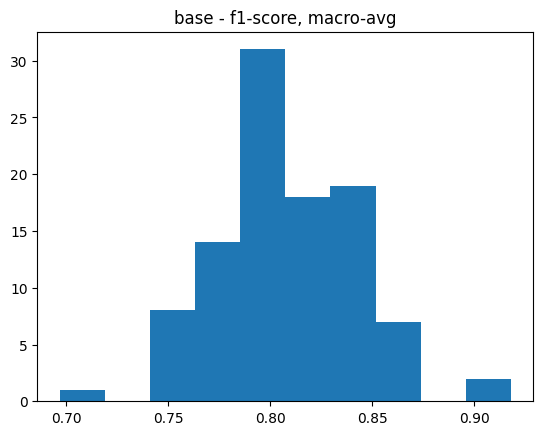

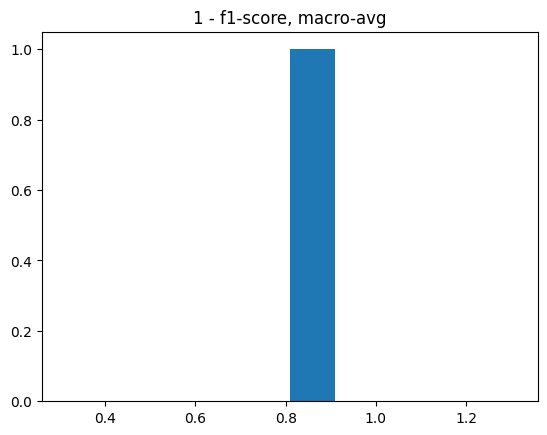

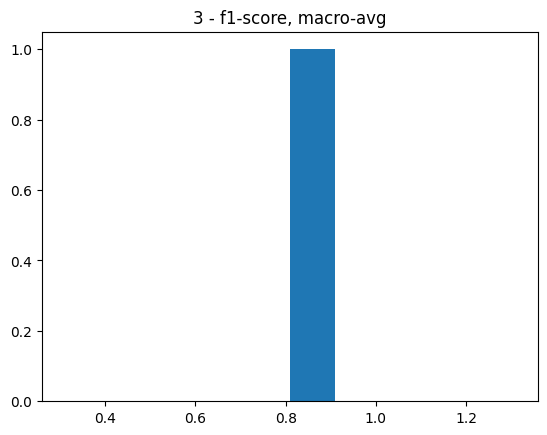

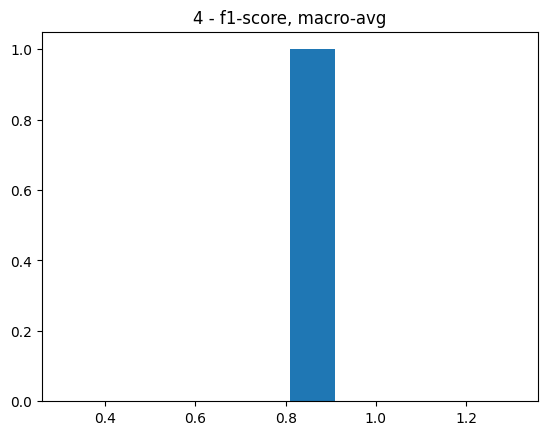

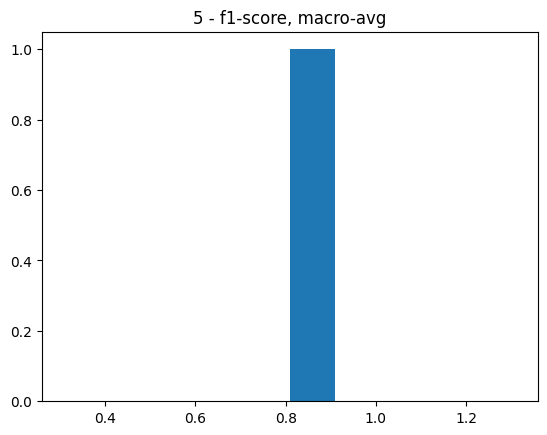

...

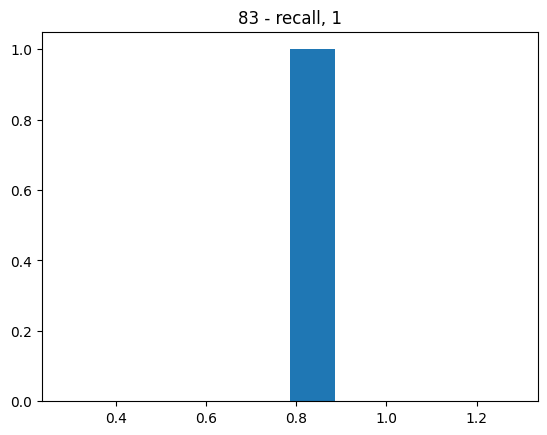

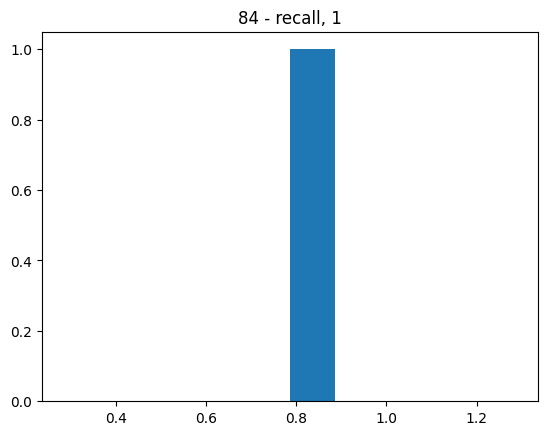

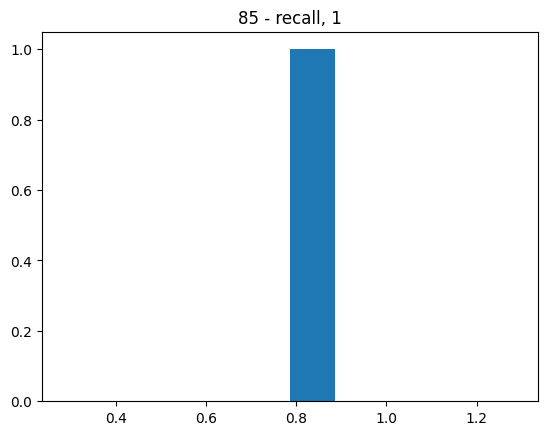

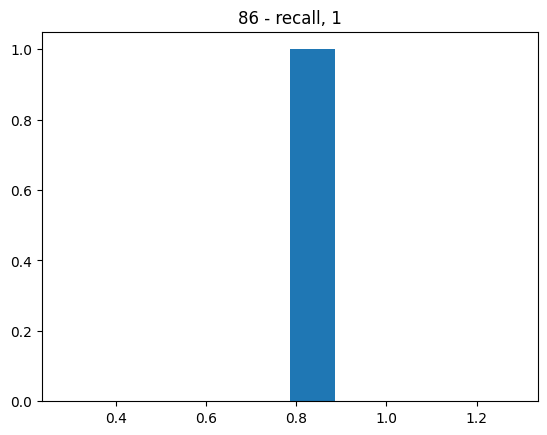

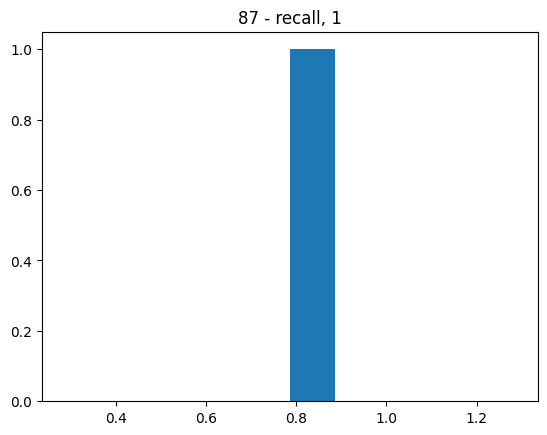

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.neighbors import KernelDensity

# we could learn a model of hyperparameters importance to a given measure
# there are several values for each hyperparameter set.  So we need to find
# the right problem.  But this is a possability.

def difference_hyperparameters(hp_groups):
    base_hps = hp_groups["base"]['hyperparameters']
    group_differences = {}
    for group in hp_groups:
        if group == "base":
            continue
        group_differences[group] = {}
        tmp_hps = hp_groups[group]["hyperparameters"]
        for hp in tmp_hps:
            if isinstance(tmp_hps[hp], int) or isinstance(tmp_hps, float):
                if not np.allclose(tmp_hps[hp], base_hps[hp]):
                    group_differences[group][hp] = tmp_hps[hp]
            else:
                if tmp_hps[hp] != base_hps[hp]:
                    group_differences[group][hp] = tmp_hps
    return group_differences

# covariance strength across groups, as a measure of hyperparameter sensitivity?

# so if f1_scores in base covary with f1_scores in hyperparameter then we are insensitive.
# the stronger the similarity the more insensitive the hyperparameters.
# we can also use ks-2sample test.
# we can also use correlation
# we can also use spearman correlation.
# we can do a simple frequency count of the number of times the hyperparameters are uncorrelated/not similar
# that gives us a coarse sense of sensitivity.  
# we can then do a sum of strength of correlation when statistically significant. for something more granular.
# we can also do a model version of this.  We regress f1_scores in A against f1_scores in B.  The better A 'fits' B, 
# the less sensitive our thing is.
# We can order the samples by seed.  Phew!        

def sort_by_seed(hp_groups):
    new_hp_groups = {}
    for group in hp_groups:
        new_hp_groups[group] = sorted(
            hp_groups[group], 
            key=lambda t: t["seed"]
        )
    return new_hp_groups


            
# the better the model does, the less sensitive the hyperparameter is
def get_model_relationship(
    hp_groups, classes, 
    model=LinearRegression()
):
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    model_count_groups = {}
    for group in hp_groups:
        if group == "base":
            continue
        model_groups[group] = []
        for measure in score_groups[group]:
            y = np.array(score_groups["base"][measure])
            x = np.array(score_groups[group][measure]).reshape(-1, 1)
            X_train, X_test, y_train, y_test = train_test_split(
                x, y, test_size=0.1
            )
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            loss = mean_absolute_error(y_test, y_pred)
            model_groups[group].append(
                (loss, group_diffs[group], group)
            )
    return model_groups

# the stronger the correlation, the less sensitive the hyperparameter is
def get_correlations(
    hp_groups, classes, 
    corr_func=stats.spearmanr
):
    """
    alt corr_func : stats.pearsonr or
    anything that implements correlation and pvalue
    as:
    res = corr_func(series_a, series_b)
    print(res.correlation, res.pvalue)
    """
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    corr_count_groups = {}
    for group in hp_groups:
        if group == "base":
            continue
        corr_count_groups[group] = []
        for measure in score_groups[group]:
            corr = corr_func(
                score_groups[group][measure],
                score_groups["base"][measure]
            )
            corr_count_groups[group].append(
                (corr.correlation, group_diffs[group], group)
            )
    return corr_count_groups

def get_variances(
    hp_groups, classes
):
    """
    """
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    var_count_groups = {}
    for group in hp_groups:
        var_count_groups[group] = []
        for measure in score_groups[group]:
            var = np.var(score_groups[group][measure])
            var_count_groups[group].append(
                (var, group_diffs[group], group)
            )
    return var_count_groups

def get_iqrs(
    hp_groups, classes
):
    """
    """
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    iqr_count_groups = {}
    for group in hp_groups:
        iqr_count_groups[group] = []
        for measure in score_groups[group]:
            iqr = stats.iqr(score_groups[group][measure])
            iqr_count_groups[group].append(
                (iqr, group_diffs[group], group)
            )
    return iqr_count_groups

# unclear if smoothing will help
# comparing each decile may still be more informative
# run these tests against density smoothed data 
# and original data
#stats.cramervonmises_2samp
#stats.ks_2samp

def get_range(
    hp_groups, classes
):
    """
    """
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    range_count_groups = {}
    for group in hp_groups:
        range_count_groups[group] = []
        for measure in score_groups[group]:
            _range = np.max(score_groups[group][measure]) - np.min(score_groups[group][measure])
            range_count_groups[group].append(
                (_range, group_diffs[group], group)
            )
    return range_count_groups

def get_density(
    hp_groups, classes
):
    hp_groups = sort_by_seed(hp_groups)
    group_diffs = difference_hyperparameters(
        hp_groups
    )
    score_groups = get_scores(hp_groups, classes)
    density_count_groups = {}
    
    for group in hp_groups:
        range_count_groups[group] = []
        for measure in score_groups[group]:
            X = score_groups[group][measure]
            kde = KernelDensity(kernel='gaussian', bandwidth=0.2).fit(X)
            density = kde.score_samples(X)
            density_count_groups[group].append(
                (density, group_diffs[group], group)
            )
    return density_count_groups

# this could be easier, just do inverse of correlation and add this to each value
# this gives us a better sense of correlation in a less coarse way.
def coarse_analyze_correlation_sensitivity(hp_groups, corr_count_groups):
    num_groups = len(hp_groups.keys())
    base_hyperparameters = hp_groups["base"][0]["hyperparameters"]
    hp_sensitivity = {}
    for group in corr_count_groups:
        for hp in corr_count_groups[group][1]:
            hp_sensitivity[group] = {
                hp: {value: 0 for value in corr_count_groups[group][1][hp]}
            }
    for group in corr_count_groups:
        if np.allclose(corr_count_groups[group][0], 0):
            for hp in corr_count_groups[group][1]:
                for value in corr_count_groups[group][1][hp]:
                    hp_sensitivity[group][hp][value] += 1
    return hp_sensitivity
                    

def coarse_analyze_model_based_sensitivity(hp_groups, model_groups):
    num_groups = len(hp_groups.keys())
    base_hyperparameters = hp_groups["base"][0]["hyperparameters"]
    hp_sensitivity = {}
    for group in model_groups:
        for hp in model_groups[group][1]:
            hp_sensitivity[group] = {
                hp: {value: 0 for value in model_groups[group][1][hp]}
            }
    for group in corr_count_groups:
        if corr_count_groups[group][0] > 0.5:
            for hp in corr_count_groups[group][1]:
                for value in corr_count_groups[group][1][hp]:
                    hp_sensitivity[group][hp][value] += 1
    return hp_sensitivity

def fine_analyze_correlation_sensitivity(hp_groups, corr_count_groups):
    """
    Bigger values imply greater sensitivity, in absolute terms
    the more experiments you run the bigger this number will be.
    """
    num_groups = len(hp_groups.keys())
    base_hyperparameters = hp_groups["base"][0]["hyperparameters"]
    hp_sensitivity = {}
    for group in corr_count_groups:
        for hp in corr_count_groups[group][1]:
            hp_sensitivity[group] = {
                hp: {value: 0 for value in corr_count_groups[group][1][hp]}
            }
    for group in corr_count_groups:
        for hp in corr_count_groups[group][1]:
            for value in corr_count_groups[group][1][hp]:
                hp_sensitivity[group][hp][value] += 1/value
    return hp_sensitivity
                    
def fine_analyze_model_based_sensitivity(hp_groups, model_groups):
    """
    Bigger values imply greater sensitivity, in absolute terms
    the more experiments you run the bigger this number will be.
    """
    num_groups = len(hp_groups.keys())
    base_hyperparameters = hp_groups["base"][0]["hyperparameters"]
    hp_sensitivity = {}
    for group in model_groups:
        for hp in model_groups[group][1]:
            hp_sensitivity[group] = {
                hp: {value: 0 for value in model_groups[group][1][hp]}
            }
    for group in corr_count_groups:
        for hp in corr_count_groups[group][1]:
            for value in corr_count_groups[group][1][hp]:
                hp_sensitivity[group][hp][value] += value
    return hp_sensitivity    


def get_scores(hp_groups, classes):
    hp_score = {}
    for group in hp_groups:
        hp_score[group] = {
                "f1-score, macro-avg": [
                model_instance["macro avg"]["f1-score"]
                for model_instance in hp_groups[group]
            ],
                "precision, macro-avg": [
                model_instance["macro avg"]["precision"]
                for model_instance in hp_groups[group]
            ],
                "recall, macro-avg": [
                model_instance["macro avg"]["recall"]
                for model_instance in hp_groups[group]
            ]
        }
        for _class in classes:
            hp_score[group][f"f1-score, {_class}"] = [
                model_instance[f"{_class}"]["f1-score"]
                for model_instance in hp_groups[group]
            ]
            hp_score[group][f"precision, {_class}"] = [
                model_instance[f"{_class}"]["precision"]
                for model_instance in hp_groups[group]
            ]
            hp_score[group][f"recall, {_class}"] = [
                model_instance[f"{_class}"]["recall"]
                for model_instance in hp_groups[group]
            ]
    return hp_score

classes = get_classes(y)
hp_groups = group_model_instances(model_instances)
score_groups = get_scores(hp_groups, classes)
measures = list(score_groups["base"].keys())
for measure in measures:
    for group in score_groups:
        dist = score_groups[group][measure]
        plt.hist(dist)
        plt.title(f"{group} - {measure}")
        plt.show()

In [24]:
classes = get_classes(y)
hp_groups = group_model_instances(model_instances)
score_groups = get_scores(hp_groups, classes)
score_groups["base"].keys()

dict_keys(['f1-score, macro-avg', 'precision, macro-avg', 'recall, macro-avg', 'f1-score, 0', 'precision, 0', 'recall, 0', 'f1-score, 1', 'precision, 1', 'recall, 1'])

In [20]:
hp_groups

{'base': [{'0': {'precision': 0.7551020408163265,
    'recall': 0.8409090909090909,
    'f1-score': 0.7956989247311828,
    'support': 44},
   '1': {'precision': 0.8627450980392157,
    'recall': 0.7857142857142857,
    'f1-score': 0.8224299065420562,
    'support': 56},
   'accuracy': 0.81,
   'macro avg': {'precision': 0.8089235694277711,
    'recall': 0.8133116883116883,
    'f1-score': 0.8090644156366195,
    'support': 100},
   'weighted avg': {'precision': 0.8153821528611445,
    'recall': 0.81,
    'f1-score': 0.8106682745452719,
    'support': 100},
   'hyperparameter_set': 'base',
   'mask': array([ True, False,  True,  True,  True,  True,  True,  True,  True,
           True,  True,  True,  True,  True, False,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,
          False,  True,  True,  True, False,  True,  True,  True,  True,
           True,  True,  True,  True,  True,  True,  True,  True,  True,
          False,  True,  True,

In [3]:
# measures from base - 
# * 
# * ks_sample test - percentage that fail null hypothesis
# 
hp_min_scores["base"]

{'f1-score, macro-avg': 0.29577464788732394,
 'precision, macro-avg': 0.21,
 'recall, macro-avg': 0.5,
 'f1-score, 0': 0.5915492957746479,
 'precision, 0': 0.42,
 'recall, 0': 1.0,
 'f1-score, 1': 0.0,
 'precision, 1': 0.0,
 'recall, 1': 0.0}

In [5]:
a = np.array([1,2,3])

In [6]:
a.astype(int)

array([1, 2, 3])